## Problem 4: 
Test DDPM on MNIST dataset. Visualize the denoising process (You should output a figure like Fig. 6 in the paper).  (30 points)

# Denoise Diffusion Probabilistic Models (DDPMs)

Denoise Diffusion Probabilistic Models (DDPMs) are generative models based on the idea of ​​reversing the noise process. The idea is pretty simple.
Use a deterministic process for a given dataset, and make it more and more noisy. We then learn a model that can reverse this process.

DDPM-based models have recently drawn a lot of attention due to their high-quality samples. In this notebook, we re-implement the given paper to be familiar with when dealing with DDPMs: <i>Denoising Diffusion Probabilistic Models</i>


# Package Installation

The package that we have used is the **einops** package. which is an open-source python framework for writing deep learning code. we hve used this to create a GIF animation of our DDPM model.

In [ ]:
!pip3 install --upgrade pip
!pip3 install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.1 MB 13.3 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.6/41.6 kB 895.0 kB/s eta 0:00:00


# Imports and Definitions

In [ ]:
# Import of libraries
import random
import imageio

import numpy as np
import torch
from torchvision.datasets.mnist import MNIST
from argparse import ArgumentParser
import torch.nn as nn
from tqdm.auto import tqdm #for progress bar
import matplotlib.pyplot as plt
import einops
from torch.optim import Adam
from torchvision.transforms import Compose, ToTensor, Lambda

from torch.utils.data import DataLoader




SEED = 0 # to initialize the random number generator
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# Definitions
STORE_PATH_MNIST = f"ddpm_model_mnist.pt"
# STORE_PATH_FASHION = f"ddpm_model_fashion.pt"


 - `no_train` : determines if you want to employ a pre-trained model without going through the training loop. Keep this as False if the model is not trained. Load a pre-trained model into the colab filesystem if you want to use it.

- `fashion` : set True if you want to use the Fashion-MNIST dataset else it uses the MNIST dataset instead (`False`).

- `batch_size`, `n_epochs` and `lr` are the training hyper-parameters. 



In [ ]:
no_train = False
fashion = True
batch_size = 128
n_epochs = 20
lr = 0.001

In [ ]:
store_path = "ddpm_mnist.pt" if not fashion else "ddpm_fashion.pt"

# Utility functions
- `show_images`: displays images in a square pattern with a custom title by defining the number of rows and columns and populating the figure with sub-plots


In [ ]:
def show_images(images, title=""): #showing the givn images as a sub-picture in a square
    
    
    if type(images) is torch.Tensor:# converting images into numpy arrays
        images = images.detach().cpu().numpy()

    
    fig = plt.figure(figsize=(8, 8)) # defining the number of n_rows and columns 
    n_rows = int(len(images) ** (1 / 2))
    n_cols = round(len(images) / n_rows)

   
    # Filling the figure with sub-plots
    index = 0
    for r in range(n_rows):
        for c in range(n_cols):
            fig.add_subplot(n_rows, n_cols, index + 1)

            if index < len(images):
                plt.imshow(images[index][0], cmap="gray")
                index += 1
    fig.suptitle(title, fontsize=30)

    # Display the figure
    #plt.show()

- `show_first_batch`: shows the images in the first batch of a DataLoader object.

In [ ]:
def show_first_batch(loader):
    for batch in loader:
        show_images(batch[0], "Images in the first batch")
        #print(show_images(batch[0], "Images in the first batch"))
        break

## Loading data
Using the MNIST dataset, we try to generate some random samples for Gaussian noise.

In [ ]:
# Loading the data
transform = Compose([
    ToTensor(),
    Lambda(lambda x: (x - 0.5) * 2)]
)
if fashion:
  ds_fn = MNIST

#  if fashion else FashionMNIST
dataset = ds_fn("./datasets", download=True, train=True, transform=transform)
loader = DataLoader(dataset, batch_size, shuffle=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./datasets/MNIST/raw/train-images-idx3-ubyte.gz to ./datasets/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./datasets/MNIST/raw/train-labels-idx1-ubyte.gz to ./datasets/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./datasets/MNIST/raw/t10k-images-idx3-ubyte.gz to ./datasets/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./datasets/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./datasets/MNIST/raw



Testing the GPU

In [ ]:
# Getting device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}\t" + (f"{torch.cuda.get_device_name(0)}" if torch.cuda.is_available() else "CPU"))

Using device: cuda	Tesla T4


#  DDPM module

We have defined the DDPM module using PyTorch. 
Since the DDPM scheme is independent of the model architecture used in each denoising step, we have defined a  model that is constructed using a `network` parameter, and the following param:

- `no_of_dsteps`: number of diffusion steps $T$;
- `min_beta`: value of the first $\beta_t$ ($\beta_1$);
- `max_beta`: value of the last  $\beta_t$ ($\beta_T$);
- `device`: device onto which the model is run;
- `dim_img`: tuple contining dimensionality of images.


 In this implementation, $t$ is assumed to be a `(N, 1)` tensor, where `N` is the number of images in tensor `x`. We thus support different time-steps for multiple images.

##The Forward Process
The `forward` process of DDPMs benefits from a nice property: We don't actually need to slowly add noise step-by-step, but we can directly skip to whathever step $t$ we want using coefficients $\alpha_bar$.

##The Backward Process 
The backward pass aims to turn the noisy image into the desired domain distribution, whether it be for denoising or image super-resolution.



For the `backward` method instead, we simply let the network do the job.

In [ ]:
# DDPM class
class MyDDPM(nn.Module):
    def __init__(self, network, no_of_dsteps=200, min_beta=10 ** -4, max_beta=0.02, device=None, dim_img=(1, 28, 28)):
        super(MyDDPM, self).__init__()
        self.no_of_dsteps = no_of_dsteps
        self.device = device
        self.dim_img = dim_img
        self.network = network.to(device)
        self.betas = torch.linspace(min_beta, max_beta, no_of_dsteps).to(
            device)  # Number of steps is typically in the order of thousands
        self.alphas = 1 - self.betas
        self.alpha_bars = torch.tensor([torch.prod(self.alphas[:i + 1]) for i in range(len(self.alphas))]).to(device)

    def forward(self, x0, t, eta=None):
        n, c, h, w = x0.shape
        a_bar = self.alpha_bars[t]

        if eta is None:
            eta = torch.randn(n, c, h, w).to(self.device)

        noisy = a_bar.sqrt().reshape(n, 1, 1, 1) * x0 + (1 - a_bar).sqrt().reshape(n, 1, 1, 1) * eta
        return noisy

    # Run each frame through the network every time step t in vector t.
    # The network returns an estimate of the added noise.
    def backward(self, x, t):
       
        return self.network(x, t)

## Visualizing forward and backward


Earlier we have shown the forward process which is independent of the denoising network with the `display_forward` method. 

We run the backward pass and generate new images with the `generate_new_images` method.
Here we create a GIF image.
Two options are considered for $\sigma_t^2$:

- $\sigma_t^2$ = $\beta_t$
- $\sigma_t^2$ = $\frac{1 - \bar{\alpha_{t-1}}}{1 - \bar{\alpha_{t}}} \beta_t$

The two formulas are rougly the same with a minor difference which is noticeable. Here we have chosen the first option out of simplicity.

In [ ]:
def display_forward(ddpm, loader, device):
    # Showing the forward process
    for batch in loader:
        imgs = batch[0]

        show_images(imgs, "Original images")

        for percent in [0.25, 0.5, 0.75, 1]:
            show_images(
                ddpm(imgs.to(device),
                     [int(percent * ddpm.no_of_dsteps) - 1 for _ in range(len(imgs))]),
                f"DDPM Noisy images {int(percent * 100)}%"
            )
        break

Given a DDPM model, a number of samples to be generated and a device, returns some newly generated samples

In [ ]:
def generate_new_images(ddpm, n_samples=16, device=None, frames_per_gif=100, gif_name="sampling.gif", c=1, h=28, w=28):
    
    frame_indexes = np.linspace(0, ddpm.no_of_dsteps, frames_per_gif).astype(np.uint)
    frames = []

    with torch.no_grad():
        if device is None:
            device = ddpm.device

        # Starting from random noise
        x = torch.randn(n_samples, c, h, w).to(device)

        for index, t in enumerate(list(range(ddpm.no_of_dsteps))[::-1]):
            # Estimating noise to be removed
            time_tensor = (torch.ones(n_samples, 1) * t).to(device).long()
            eta_theta = ddpm.backward(x, time_tensor)

            alpha_t = ddpm.alphas[t]
            alpha_t_bar = ddpm.alpha_bars[t]

            # Partially denoising the image
            x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t) / (1 - alpha_t_bar).sqrt() * eta_theta)

            if t > 0:
                z = torch.randn(n_samples, c, h, w).to(device)

                # 1: sigma_t squared = beta_t
                beta_t = ddpm.betas[t]
                sigma_t = beta_t.sqrt()
                x = x + sigma_t * z #adding more noise

            # Adding frames to the GIF
            if index in frame_indexes or t == 0:
                # Putting digits in range [0, 255]
                normalized = x.clone()
                for i in range(len(normalized)):
                    normalized[i] -= torch.min(normalized[i])
                    normalized[i] *= 255 / torch.max(normalized[i])

                frame = einops.rearrange(normalized, "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=int(n_samples ** 0.5)) # reshaping the batch to square frame
                frame = frame.cpu().numpy().astype(np.uint8)

                frames.append(frame)

    # Storing the gif

    
    with imageio.get_writer(gif_name, mode="I") as writer:
        for index, frame in enumerate(frames):
            writer.append_data(frame)
            if index == len(frames) - 1:
                for _ in range(frames_per_gif // 3):
                    writer.append_data(frames[-1])
    return x

# U-Net architecture

We have defined an architecture that will be responsible for denoising of the images.  

The only loss function term of interest is $||\epsilon - \epsilon_\theta(\sqrt{\bar{\alpha}_t}x_0 + \sqrt{1 - \bar{\alpha } is _t} \epsilon, t)||^2$, where $\epsilon$ is the random noise and $\epsilon_\theta$ is the model's prediction for the noise. $\epsilon_\theta$ is a function of both $x$ and $t$ and I don't want to use a separate model (thousands of independent models) for each denoising step. We have used a single model insteadvthat is defined as input and takes a scalar value specifying an image $x$ and a time step $t$.

To implement this, we have actually used the sinusoidal embedding `sinusoidal_embedding` function. This maps each time step to the `time_emb_dim` dimension. These time embeddings are further mapped with some time embedding MLP (function `_make_te`) and added to the tensor per channel through the network.



In [ ]:
def sinusoidal_embedding(n, d):
   
    #sin_mask = torch.arange(0, n, 2)
    #embedding = torch.tensor([[i / 10_000 ** (2 * j / d) for j in range(d)] for i in range(n)])
    #embedding[1 - sin_mask] = torch.cos(embedding[sin_mask])
    
    embedding = torch.tensor([[i / 10_000 ** (2 * j / d) for j in range(d)] for i in range(n)])
    sin_mask = torch.arange(0, n, 2)

    embedding[sin_mask] = torch.sin(embedding[sin_mask])
    embedding[1 - sin_mask] = torch.cos(embedding[sin_mask])

    return embedding

In [ ]:
class MyBlock(nn.Module):
    def __init__(self, shape, in_c, out_c, kernel_size=3, stride=1, padding=1, activation=None, normalize=True):
        super(MyBlock, self).__init__()
        self.ln = nn.LayerNorm(shape)
        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size, stride, padding)
        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size, stride, padding)
        self.activation = nn.SiLU() if activation is None else activation
        self.normalize = normalize

    def forward(self, x):
        out = self.ln(x) if self.normalize else x
        out = self.conv1(out)
        out = self.activation(out)
        out = self.conv2(out)
        out = self.activation(out)
        return out

In [ ]:
class MyUNet(nn.Module):
    def __init__(self, n_steps=1000, time_emb_dim=100):
        super(MyUNet, self).__init__()

        # Sinusoidal embedding

        #self.time_embed.requires_grad_(True)
        self.time_embed = nn.Embedding(n_steps, time_emb_dim)
        self.time_embed.weight.data = sinusoidal_embedding(n_steps, time_emb_dim)
        self.time_embed.requires_grad_(False)

        # First half
        self.te1 = self._make_te(time_emb_dim, 1)
        self.b1 = nn.Sequential(
            MyBlock((1, 28, 28), 1, 10),
            MyBlock((10, 28, 28), 10, 10),
            MyBlock((10, 28, 28), 10, 10)
            #MyBlock((10, 28, 28), 10, 10)
        )
        self.down1 = nn.Conv2d(10, 10, 4, 2, 1)

        self.te2 = self._make_te(time_emb_dim, 10)
        self.b2 = nn.Sequential(
            MyBlock((10, 14, 14), 10, 20),
            MyBlock((20, 14, 14), 20, 20),
            MyBlock((20, 14, 14), 20, 20)
        )
        self.down2 = nn.Conv2d(20, 20, 4, 2, 1)

        self.te3 = self._make_te(time_emb_dim, 20)
        self.b3 = nn.Sequential(
            MyBlock((20, 7, 7), 20, 40),
            MyBlock((40, 7, 7), 40, 40),
            MyBlock((40, 7, 7), 40, 40)
        )
        self.down3 = nn.Sequential(
            nn.Conv2d(40, 40, 2, 1),
            nn.SiLU(),
            nn.Conv2d(40, 40, 4, 2, 1)
        )

        # Bottleneck
        self.te_mid = self._make_te(time_emb_dim, 40)
        self.b_mid = nn.Sequential(
            MyBlock((40, 3, 3), 40, 20),
            MyBlock((20, 3, 3), 20, 20),
            MyBlock((20, 3, 3), 20, 40)
        )

        # Second half
        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(40, 40, 4, 2, 1),
            nn.SiLU(),
            nn.ConvTranspose2d(40, 40, 2, 1)
        )

        self.te4 = self._make_te(time_emb_dim, 80)
        self.b4 = nn.Sequential(
            MyBlock((80, 7, 7), 80, 40),
            MyBlock((40, 7, 7), 40, 20),
            MyBlock((20, 7, 7), 20, 20)
        )

        self.up2 = nn.ConvTranspose2d(20, 20, 4, 2, 1)
        self.te5 = self._make_te(time_emb_dim, 40)
        self.b5 = nn.Sequential(
            MyBlock((40, 14, 14), 40, 20),
            MyBlock((20, 14, 14), 20, 10),
            MyBlock((10, 14, 14), 10, 10)
        )

        self.up3 = nn.ConvTranspose2d(10, 10, 4, 2, 1)
        self.te_out = self._make_te(time_emb_dim, 20)
        self.b_out = nn.Sequential(
            MyBlock((20, 28, 28), 20, 10),
            MyBlock((10, 28, 28), 10, 10),
            MyBlock((10, 28, 28), 10, 10, normalize=False)
        )

        self.conv_out = nn.Conv2d(10, 1, 3, 1, 1)

    def forward(self, x, t):
        # x is (N, 2, 28, 28) (image with positional embedding stacked on channel dimension)
        t = self.time_embed(t)
        n = len(x)
        out1 = self.b1(x + self.te1(t).reshape(n, -1, 1, 1))  # (N, 10, 28, 28)
        out2 = self.b2(self.down1(out1) + self.te2(t).reshape(n, -1, 1, 1))  # (N, 20, 14, 14)
        out3 = self.b3(self.down2(out2) + self.te3(t).reshape(n, -1, 1, 1))  # (N, 40, 7, 7)

        out_mid = self.b_mid(self.down3(out3) + self.te_mid(t).reshape(n, -1, 1, 1))  # (N, 40, 3, 3)

        out4 = torch.cat((out3, self.up1(out_mid)), dim=1)  # (N, 80, 7, 7)
        out4 = self.b4(out4 + self.te4(t).reshape(n, -1, 1, 1))  # (N, 20, 7, 7)

        out5 = torch.cat((out2, self.up2(out4)), dim=1)  # (N, 40, 14, 14)
        out5 = self.b5(out5 + self.te5(t).reshape(n, -1, 1, 1))  # (N, 10, 14, 14)

        out = torch.cat((out1, self.up3(out5)), dim=1)  # (N, 20, 28, 28)
        out = self.b_out(out + self.te_out(t).reshape(n, -1, 1, 1))  # (N, 1, 28, 28)

        out = self.conv_out(out)

        return out

    def _make_te(self, dim_in, dim_out):
        return nn.Sequential(
            nn.Linear(dim_in, dim_out),
            nn.SiLU(),
            nn.Linear(dim_out, dim_out)
        )

# Instantiating the model

Here we have instantiated a model, with forward and backward processes that defines a training loop for our model to test the generative capabilities.

In [ ]:
# Defining model
no_of_dsteps, min_beta, max_beta = 1000, 10 ** -4, 0.02  
ddpm = MyDDPM(MyUNet(no_of_dsteps), no_of_dsteps=no_of_dsteps, min_beta=min_beta, max_beta=max_beta, device=device)

# Optional visualizations

<ipython-input-5-b0ea4c547b49>:17: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  fig.add_subplot(n_rows, n_cols, index + 1)


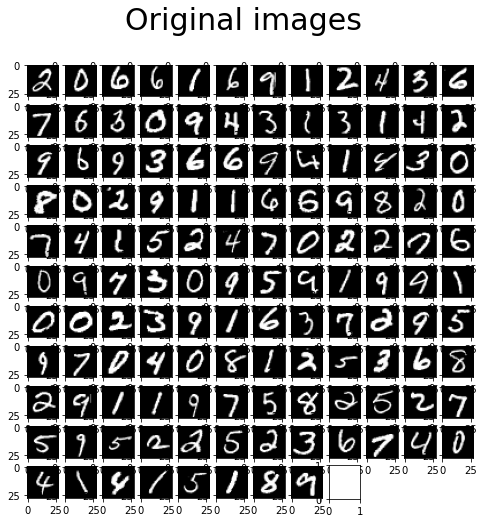

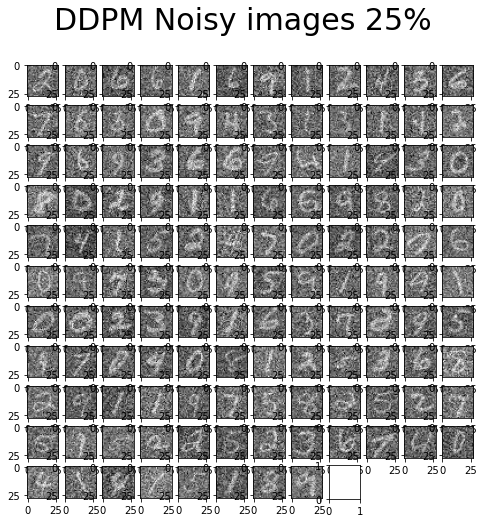

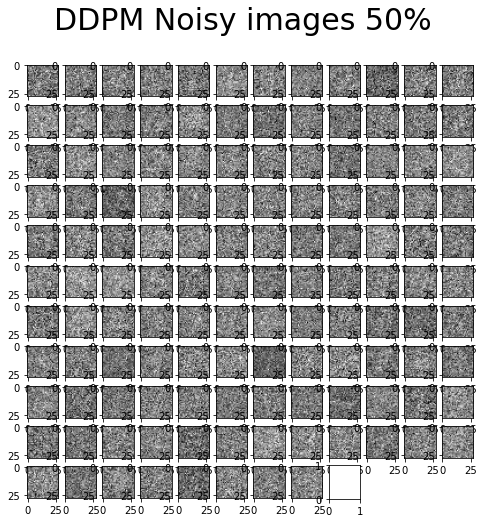

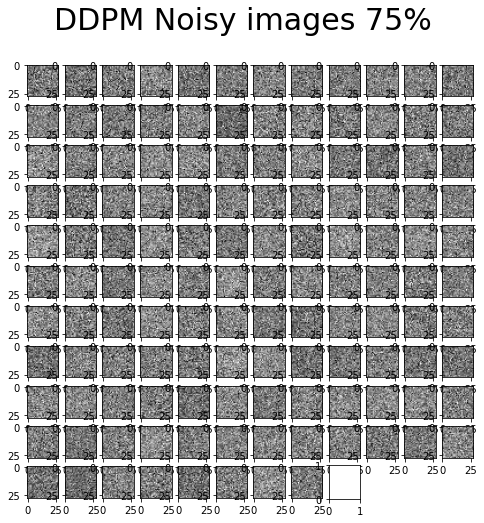

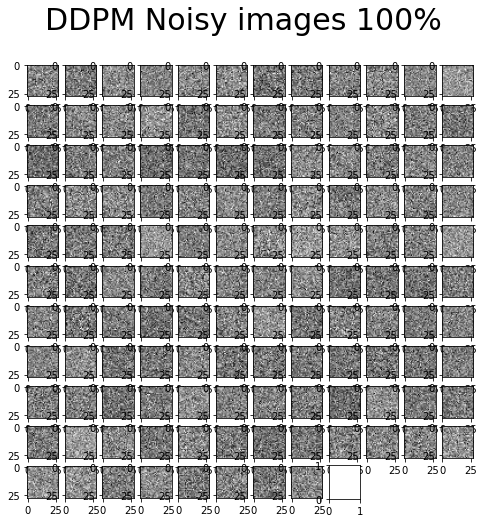

In [ ]:
# displaying the diffusion process
display_forward(ddpm, loader, device)

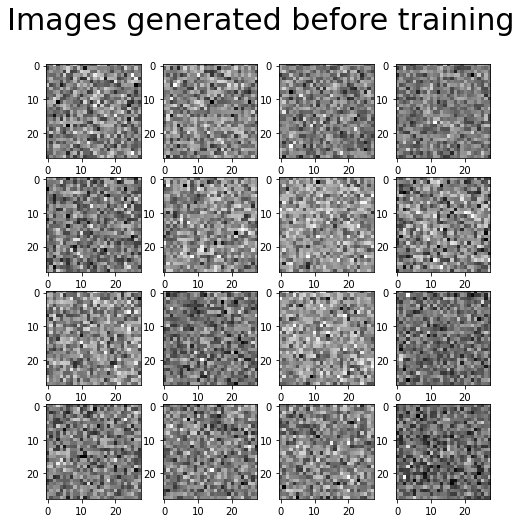

In [ ]:
# Optionally, show the denoising (backward) process
generated = generate_new_images(ddpm, gif_name="before_training.gif")
show_images(generated, "Images generated before training")

# Training loop

Run the batch transfer process for each batch of datasets. Use a different time step t for each N images of the (N,C,H,W) batch tensor to increase training stability. The added noise is (N,C,H,W)-tensor ϵ.

Once we have the noisy images, we try to predict ϵ from them using a network. Optimize with a simple mean squared error (MSE) loss.

In [ ]:
def training_loop(ddpm, loader, n_epochs, optim, device, display=False, store_path="ddpm_model.pt"):
    mse = nn.MSELoss()
    best_loss = float("inf")
    no_of_dsteps = ddpm.no_of_dsteps

    
    for epoch in tqdm(range(n_epochs), desc=f"Training progress", colour="#00ff00"):
        epoch_loss = 0.0
        for step, batch in enumerate(tqdm(loader, leave=False, desc=f"Epoch {epoch + 1}/{n_epochs}", colour="#005500")):
            x0 = batch[0].to(device)
            n = len(x0)

            eta = torch.randn_like(x0).to(device) #collecting noise for images at each step
            t = torch.randint(0, no_of_dsteps, (n,)).to(device)

            noisy_imgs = ddpm(x0, t, eta)# creating the noisy image using forward process

         
            eta_theta = ddpm.backward(noisy_imgs, t.reshape(n, -1))#model estimation of noise based on the generated images and time-step


            loss = mse(eta_theta, eta)#calculating the optimised MSE between the noise inputted and the predicted noise
            optim.zero_grad()
            loss.backward()
            optim.step()

            epoch_loss += loss.item() * len(x0) / len(loader.dataset)

        if display:
            show_images(generate_new_images(ddpm, device=device), f"Images generated at epoch {epoch + 1}")

        log_string = f"Loss at epoch {epoch + 1}: {epoch_loss:.3f}"

        if best_loss > epoch_loss:
            best_loss = epoch_loss
            torch.save(ddpm.state_dict(), store_path)
            log_string += " --> Best model ever (stored)"

        print(log_string)

In [ ]:
store_path = "ddpm_fashion.pt" if fashion else "ddpm_mnist.pt"
if not no_train:
    training_loop(ddpm, loader, n_epochs, optim=Adam(ddpm.parameters(), lr), device=device, store_path=store_path)

Training progress:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 1: 0.169 --> Best model ever (stored)


Epoch 2/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 2: 0.052 --> Best model ever (stored)


Epoch 3/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 3: 0.043 --> Best model ever (stored)


Epoch 4/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 4: 0.040 --> Best model ever (stored)


Epoch 5/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 5: 0.037 --> Best model ever (stored)


Epoch 6/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 6: 0.036 --> Best model ever (stored)


Epoch 7/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 7: 0.035 --> Best model ever (stored)


Epoch 8/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 8: 0.034 --> Best model ever (stored)


Epoch 9/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 9: 0.034 --> Best model ever (stored)


Epoch 10/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 10: 0.033 --> Best model ever (stored)


Epoch 11/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 11: 0.032 --> Best model ever (stored)


Epoch 12/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 12: 0.032 --> Best model ever (stored)


Epoch 13/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 13: 0.031 --> Best model ever (stored)


Epoch 14/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 14: 0.031 --> Best model ever (stored)


Epoch 15/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 15: 0.031 --> Best model ever (stored)


Epoch 16/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 16: 0.030 --> Best model ever (stored)


Epoch 17/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 17: 0.031


Epoch 18/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 18: 0.030 --> Best model ever (stored)


Epoch 19/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 19: 0.030 --> Best model ever (stored)


Epoch 20/20:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 20: 0.030 --> Best model ever (stored)


# Model Performance

So here we have stored the best performing model according to the training loss and put it in evaluation mode.
Then, we have generated a series of images, and created a GIF of it as well.

In [ ]:
# Loading the trained model
final_model = MyDDPM(MyUNet(), no_of_dsteps=no_of_dsteps, device=device)
final_model.load_state_dict(torch.load(store_path, map_location=device))
final_model.eval()
print("Model loaded: Generating new images")

Model loaded: Generating new images


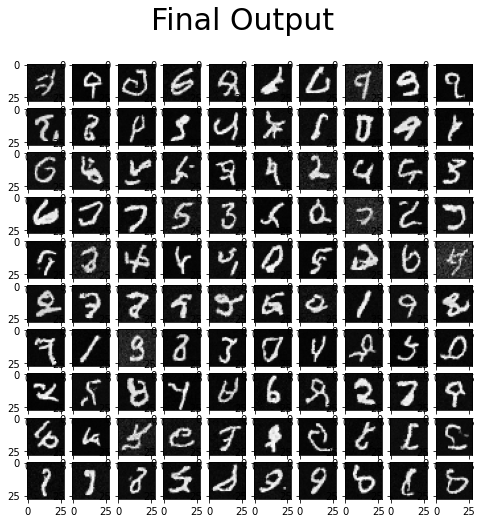

In [ ]:
generated = generate_new_images(
        final_model,
        n_samples=100,
        device=device,
        gif_name="mnist.gif" if not fashion else "fashion.gif"
    )
show_images(generated, "Final Output")

# Visualizing the diffusion process
with GIF

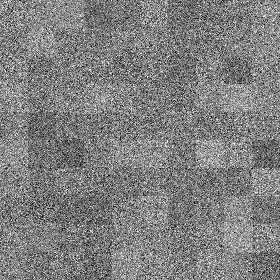

In [ ]:
from IPython.display import Image

Image(open('mnist.gif' if not fashion else 'fashion.gif','rb').read())

# Conclusion

Thus we have implemented the DDPM using PyTorch module . Using  U-Net architecture and sinusoidal position embedding technique, we tuned the denoising process of the network to specific time steps.